# Анализ отзывов клиентов интернет-магазина одежды

Этот набор данных содержит отзывы клиентов *Fashion Nova*, популярного интернет-магазина одежды. Каждая запись содержит подробную информацию об опыте рецензента в отношении бренда, включая рейтинги, заголовки отзывов, тексты отзывов и другие соответствующие метаданные. Эти данные полезны для анализа удовлетворенности клиентов, понимания настроений и выявления тенденций в отзывах пользователей с течением времени.

## Описание данных

* `Reviewer Name` - имя или псевдоним рецензента
* `Profile Link` - ссылка на профиль рецензента
* `Country` - страна рецензента
* `Review Count` - количество отзывов, представленных рецензентом
* `Review Date` - дата публикации отзыва
* `Rating` - оценка, данная рецензентом, выраженная в количестве звезд (например, "Оценка 5 из 5 звезд")
* `Review Title` - заголовок отзыва
* `Review Text` - полный текст отзыва
* `Date of Experience` - дата, когда клиент ознакомился с услугой или продуктом


**Задача**

Провести кластеризацию отзывов для анализа удовлетворенности клиентов, понимания настроений и выявления тенденций в отзывах пользователей.

* **Шаг 1.** Предобработка текста: стоп-слова, лишние символы, низко/высокочастотные слова.
* **Шаг 2.** Преобразование текста в эмбеддинги: tf-idf, word2vec, glove.
* **Шаг 3.** Снижение размерности эмбеддингов: PCA, UMAP, T-SNE.
* **Шаг 4.** Кластеризация финальных эмбеддингов: KMeans, MiniBatchKMeans, DBSCAN, HDBSCAN, AffinityPropagation, SpectralClustering.
* **Шаг 5.** Визуализировать результаты кластеризации.
* **Шаг 6.** Для каждого из полученных кластеров определите топ-5 слов, топ-5 биграмм, топ-5 документов (отзывов).
* **Шаг 7.** Найдите 5 ближайших соседей для произвольного отзыва в каждом кластере. Изучите [парные меры сходства](https://scikit-learn.org/stable/modules/metrics.html). Для оценки близости используйте косинусное расстояние.

**Рекомендации**

1. [Полезная инструкция](https://habr.com/ru/companies/oleg-bunin/articles/352614/)
2. [Сравнение текстовых документов в Python: NLP и сходство](https://sky.pro/wiki/python/sravnenie-tekstovykh-dokumentov-v-python-nlp-i-skhodstvo/)



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import re
from pymystem3 import Mystem

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import utils
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer, text_to_word_sequence
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, HDBSCAN
from yellowbrick.cluster import KElbowVisualizer, ClusteringScoreVisualizer
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity

%matplotlib inline
import nltk
from nltk.corpus import stopwords as nltk_stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Прочитаем файл `fashionnova_reviews.csv` с данными в переменную `df`.

In [ ]:
try:
    df = pd.read_csv('fashionnova_reviews.csv')
except:
    from google.colab import drive
    drive.mount('/content/drive')
    df = pd.read_csv('/content/drive/MyDrive/прикладные модели машинного обучения/fashionnova_reviews.csv')

In [ ]:
df.head()

,Reviewer Name,Profile Link,Country,Review Count,Review Date,Rating,Review Title,Review Text,Date of Experience
0,Champagne,/users/66c78240087b6269ffbcb5fb,US,1 review,2024-08-22T20:24:02.000Z,Rated 5 out of 5 stars,I love ordering from fashion nova,"I love ordering from fashion nova. The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy, I even got my BF putting in his orders lol.","August 22, 2024"
1,Vg customer,/users/6618fdb53d4198001210cbe7,VG,3 reviews,2024-08-21T05:43:11.000Z,Rated 5 out of 5 stars,Top tier content for fashion nova,Always amazing clothes and the fast shipping is really good but let’s talk about the CLOTHES omggggg the stretchy fabrics I loveeee . If you need a quick and easy fit fashion nova is the store for you I’m an international customer trust me fashion nova will never disappoint.. love them so much,"August 18, 2024"
2,Colleen Burgher,/users/64e9595206be1a001244ff73,US,3 reviews,2024-08-21T17:09:14.000Z,Rated 5 out of 5 stars,Prices and quality of products are…,"Prices and quality of products are GREAT Would love to see a cash refund if I have to return an unused item. Bought extra items since I forget to add expedited shipping, sent an email to change shipping method and I would pay extra but no response so I ended up with double items. Other than that great job.","August 21, 2024"
3,R.G.M,/users/66c58ad1c6ab36352a08f57a,US,1 review,2024-08-21T08:36:03.000Z,Rated 5 out of 5 stars,Great customer service,Great customer service. I was helped until the Fashion Nova was able to provide a solution to my problem. I appreciate what they did for me. I love their products and I’m a very happy customer who will continue to support and buy from this brand!!!!,"August 20, 2024"
4,Rosalyn Cousar,/users/60ad4b6ef3788e001adbb8e3,US,5 reviews,2024-08-22T00:46:16.000Z,Rated 3 out of 5 stars,False advertising,Disappointing experience. You don’t live up to your advertising! BOGO should be applied to all items being purchased. If more than 2 items are part of purchase then BOGO should continue to be applied to whole purchase and all items! The advertising is false and not true. I did not read anywhere that BOGO is only to be applied once during purchase. The company is being shady!!!,"August 21, 2024"


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131980 entries, 0 to 131979
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   Reviewer Name       131917 non-null  object
 1   Profile Link        131980 non-null  object
 2   Country             131976 non-null  object
 3   Review Count        131980 non-null  object
 4   Review Date         131980 non-null  object
 5   Rating              131980 non-null  object
 6   Review Title        131932 non-null  object
 7   Review Text         131980 non-null  object
 8   Date of Experience  131980 non-null  object
dtypes: object(9)
memory usage: 9.1+ MB


Оценим количество пропусков и дублткатов.

In [ ]:
df['Review Text'].isnull().mean()

0.0

In [ ]:
df.duplicated().sum()

66

In [ ]:
df=df.drop_duplicates().reset_index(drop=True)

## Шаги 1, 2. Предобработка и векторизация данных

In [ ]:
# Возьмём для анализа первые 10000 отзывов
data = pd.DataFrame(df[:10000]['Review Text']) #берём все

In [ ]:
m = Mystem()
#Функция для очистки и лемматизации
def data_clear_lemmatize(text):
  text = re.sub(pattern='[^a-zA-Z ]',
                 repl=' ',
                 string=text.strip())
  return ''.join(m.lemmatize(text=text))

Installing mystem to /root/.local/bin/mystem from http://download.cdn.yandex.net/mystem/mystem-3.1-linux-64bit.tar.gz


In [ ]:
# Функция для устранения лишних пробелов и пунктуации
def clear_text(text):
    text = re.sub(r'[^a-zA-Z ]', ' ', text)
    return " ".join(text.split())

In [ ]:
data['lemm_text'] = [data_clear_lemmatize(clear_text(data['Review Text'].values[i])) for i in range(len(data['Review Text'].values))]

In [ ]:
data

,Review Text,lemm_text
0,"I love ordering from fashion nova. The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy, I even got my BF putting in his orders lol.",I love ordering from fashion nova The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy I even got my BF putting in his orders lol\n
1,Always amazing clothes and the fast shipping is really good but let’s talk about the CLOTHES omggggg the stretchy fabrics I loveeee . If you need a quick and easy fit fashion nova is the store for you I’m an international customer trust me fashion nova will never disappoint.. love them so much,Always amazing clothes and the fast shipping is really good but let s talk about the CLOTHES omggggg the stretchy fabrics I loveeee If you need a quick and easy fit fashion nova is the store for you I m an international customer trust me fashion nova will never disappoint love them so much\n
2,"Prices and quality of products are GREAT Would love to see a cash refund if I have to return an unused item. Bought extra items since I forget to add expedited shipping, sent an email to change shipping method and I would pay extra but no response so I ended up with double items. Other than that great job.",Prices and quality of products are GREAT Would love to see a cash refund if I have to return an unused item Bought extra items since I forget to add expedited shipping sent an email to change shipping method and I would pay extra but no response so I ended up with double items Other than that great job\n
3,Great customer service. I was helped until the Fashion Nova was able to provide a solution to my problem. I appreciate what they did for me. I love their products and I’m a very happy customer who will continue to support and buy from this brand!!!!,Great customer service I was helped until the Fashion Nova was able to provide a solution to my problem I appreciate what they did for me I love their products and I m a very happy customer who will continue to support and buy from this brand\n
4,Disappointing experience. You don’t live up to your advertising! BOGO should be applied to all items being purchased. If more than 2 items are part of purchase then BOGO should continue to be applied to whole purchase and all items! The advertising is false and not true. I did not read anywhere that BOGO is only to be applied once during purchase. The company is being shady!!!,Disappointing experience You don t live up to your advertising BOGO should be applied to all items being purchased If more than items are part of purchase then BOGO should continue to be applied to whole purchase and all items The advertising is false and not true I did not read anywhere that BOGO is only to be applied once during purchase The company is being shady\n
...,...,...
9995,Awesome. Loved all the variety of outfits.,Awesome Loved all the variety of outfits\n
9996,Love some of the clothes at FN. I am older so some clothing is not suitable for me. I do love what I can purchase and feel comfortable with.,Love some of the clothes at FN I am older so some clothing is not suitable for me I do love what I can purchase and feel comfortable with\n
9997,Review text not found,Review text not found\n
9998,Love the prices!!,Love the prices\n


Векторизуем данные. Для решения задачи кластеризации представим тексты в числовом формате как `tf-idf` признаки

In [ ]:
tfidf_vect  = TfidfVectorizer(stop_words=['english'], min_df=5, max_df=0.7, ngram_range=(1, 1))

tf_idf = tfidf_vect .fit_transform(data['lemm_text'].values)

In [ ]:
tf_idf.shape

(10000, 1640)

In [ ]:
tf_idf

<10000x1640 sparse matrix of type '<class 'numpy.float64'>'
	with 125469 stored elements in Compressed Sparse Row format>

## Шаг 3. Снижение размерности эмбеддингов

**PCA (Principal Component Analysis)** - метод главных компонент находит только линейные комбинации исходных признаков.

Определим, какое количество компонент необходимо для сохранения 90% информации данных



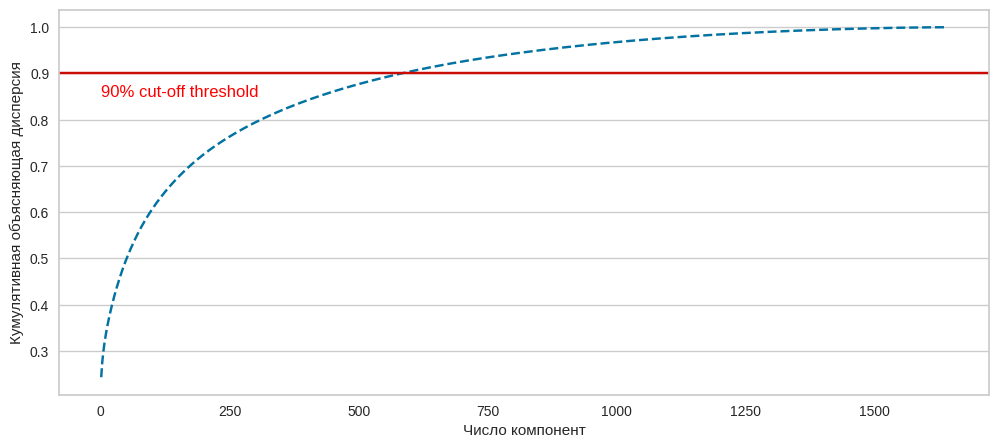

In [ ]:
pca = PCA().fit(tf_idf)

plt.figure(figsize=(12, 5))
x = np.arange(1, len(pca.explained_variance_ratio_)+1,1)
plt.plot(x, np.cumsum(pca.explained_variance_ratio_), linestyle='--', color='b')
plt.axhline(y=0.9, color='r', linestyle='-')
plt.text(0.6, 0.85, '90% cut-off threshold', color = 'red', fontsize=12)
plt.grid(axis='x')

plt.xlabel('Число компонент')
plt.ylabel('Кумулятивная объясняющая дисперсия');

Для сохранения не менее 90% информации необходимо около 600 компонент.

In [ ]:
pca_600 = PCA(n_components=600, random_state=12345)
X = pca_600.fit_transform(tf_idf)
sum(pca_600.explained_variance_ratio_)

0.904369945026162

In [ ]:
# Визуализируем векторы в пространстве 3 компонент

pca_3 = PCA(n_components=3, random_state=12345)
X_pca_3 = pca_3.fit_transform(tf_idf)

fig = px.scatter_3d(
    X_pca_3, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

In [ ]:
# Выделим 250 компонент
pca = PCA(n_components=250, random_state=12345)
X_emb = pca.fit_transform(tf_idf)
sum(pca.explained_variance_ratio_)

0.7637770855835648

## Шаг 4. Кластеризация эмбеддингов

Определим число кластеров методом локтя. Построим график изменения межкластерного расстояния с использованием автоматического визуализатора `KElbowVisualizer`

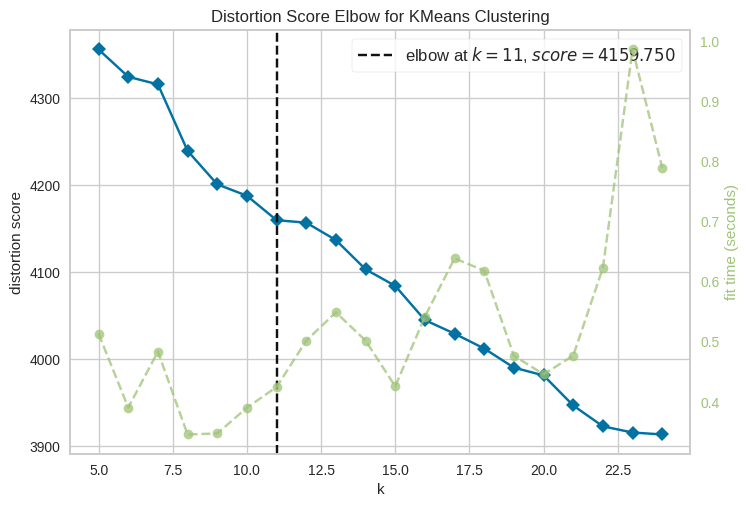

In [ ]:
visual_elbow = KElbowVisualizer(KMeans(random_state = 12345, init ='k-means++'), k = (5,25))
visual_elbow.fit(X_emb)
visual_elbow.poof()
plt.show()# говорит что 11 кластеров надо

Оптимальное число кластеров равно 11, но для интерпретируемости результатов разьём отзывы на 5 кластеров.



In [ ]:
kmeans_model = KMeans(n_clusters = 5, random_state = 12345) #мы взяли 5 кластеров
labels_km = kmeans_model.fit(tf_idf).labels_
silhouette_score_km = silhouette_score(tf_idf, labels_km)
print('коэффициент силуэта равен', silhouette_score_km) #лучше использовать косинусное расстояние

коэффициент силуэта равен 0.30098412399347485


In [ ]:
def silhouette_plot(
    data: pd.DataFrame, labels: np.array, metric="euclidean", ax: plt.Axes = None
) -> None:
    """
    Функция вывода графика силуэтного скора
    :param data: данные
    :param labels: метки кластеров
    :param metric: метрика
    :return: None
    """
    if ax is None:
        fig, ax = plt.subplots(1, 1)
        fig.set_size_inches(7, 5)

    silhouette_values = silhouette_samples(data, labels, metric=metric)
    y_lower, y_upper = 0, 0

    for i, cluster in enumerate(np.unique(labels)):
        cluster_silhouette_vals = silhouette_values[labels == cluster]
        cluster_silhouette_vals.sort()
        y_upper += len(cluster_silhouette_vals)
        ax.barh(
            range(y_lower, y_upper), cluster_silhouette_vals, edgecolor="none", height=1
        )
        ax.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
        y_lower += len(cluster_silhouette_vals)

    # Получение средней оценки силуэтного скора и построение графика
    avg_score = float(np.mean(silhouette_values))
    ax.axvline(avg_score, linestyle="--", linewidth=1, color="red")
    ax.set_xlabel(f"Silhouette  = {round(avg_score, 2)}")
    ax.set_ylabel("Метки кластеров")
    ax.set_title("График силуэта для различных кластеров", y=1.02)

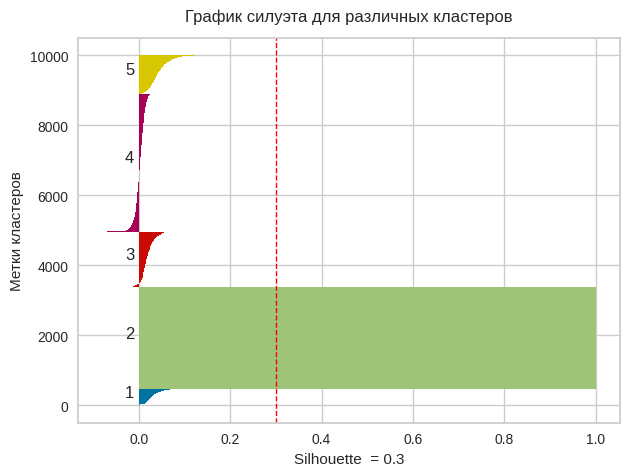

In [ ]:
silhouette_plot(tf_idf, labels_km) # в отрицательную сторону не должнл уходить, 5 классетров много, коэфи силуэта 0,3

Видим один большой кластер и 4 примерно одинакового размера, причем имеются объекты двух кластеров, которые ближе к объектам другого кластера. Попробуем выделить 3 кластера.

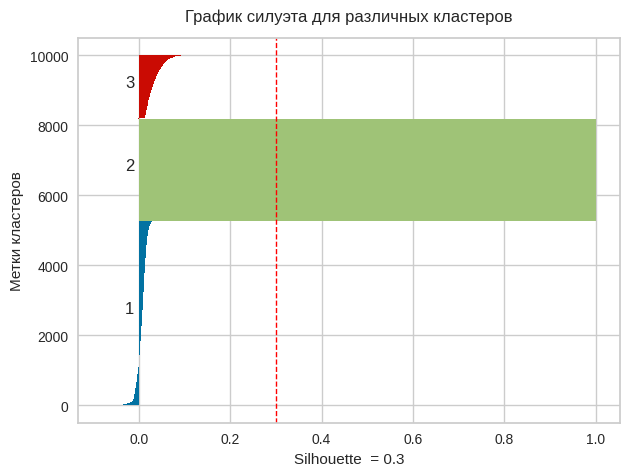

In [ ]:
kmeans_model = KMeans(n_clusters = 3, init ='k-means++', random_state = 12345)
labels_km = kmeans_model.fit(tf_idf).labels_
silhouette_plot(tf_idf, labels_km) #опять один кластер

In [ ]:
# to understand what kind of words generated as columns by BOW
terms1 = tfidf_vect.get_feature_names_out()

In [ ]:
print("Top terms per cluster:")
order_centroids = kmeans_model.cluster_centers_.argsort()[:, ::-1]
for i in range(3):
    print("Cluster %d:" % i, end='')
    for ind in order_centroids[i, :3]:
        print(' %s' % terms1[ind], end='')
        print()

Top terms per cluster:
Cluster 0: the
 and
 to
Cluster 1: text
 review
 found
Cluster 2: easy
 great
 and


## Шаг 5. Визуализация результатов кластеризации

Добавим метки кластеров в исходный датасет.

In [ ]:
data['cluster'] = labels_km
data['cluster'].value_counts()

,count
cluster,
0,5274
1,2906
2,1820


In [ ]:
fig = px.scatter_3d(
    X_pca_3, x=0, y=1, z=2,
    labels={'color': 'species'},
    color = data['cluster']
)
fig.update_traces(marker_size=2)
fig.show()

In [ ]:
#используем ворд2век вместо айдиф
#когда определимся с кластерами строим рейтинг(топ 5 слов )
#найти косинусное расстояние отсротировать и выбрать первые 5

## Шаг 6. Топ-5

# Подгтовка текста и word2vec

Для каждого из полученных кластеров определите топ-5 слов, топ-5 документов (отзывов). Найдите 5 ближайших соседей для произвольного отзыва в каждом кластере.



In [ ]:
data = pd.DataFrame(df['Review Text']) #берём все

In [ ]:
data

,Review Text
0,"I love ordering from fashion nova. The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy, I even got my BF putting in his orders lol."
1,Always amazing clothes and the fast shipping is really good but let’s talk about the CLOTHES omggggg the stretchy fabrics I loveeee . If you need a quick and easy fit fashion nova is the store for you I’m an international customer trust me fashion nova will never disappoint.. love them so much
2,"Prices and quality of products are GREAT Would love to see a cash refund if I have to return an unused item. Bought extra items since I forget to add expedited shipping, sent an email to change shipping method and I would pay extra but no response so I ended up with double items. Other than that great job."
3,Great customer service. I was helped until the Fashion Nova was able to provide a solution to my problem. I appreciate what they did for me. I love their products and I’m a very happy customer who will continue to support and buy from this brand!!!!
4,Disappointing experience. You don’t live up to your advertising! BOGO should be applied to all items being purchased. If more than 2 items are part of purchase then BOGO should continue to be applied to whole purchase and all items! The advertising is false and not true. I did not read anywhere that BOGO is only to be applied once during purchase. The company is being shady!!!
...,...
131909,My account had over 400$ missing over 2 weeks ago and Fashonnova still hasn't explained to me as why ? I'm very disappointed & hurt because I'm a regular customer I never knew something like this could happen to me when I shop there weekly
131910,It was timely true to size. This company truly seems to know what women want to wear and what men want to see them in.
131911,Kyndall was so helpful!! Definitely will be ordering again soon!!
131912,"Great customer service support which honestly makes a difference in shopping online. Kyndall was super helpful, she went above and beyond to resolve my issue."


In [ ]:
m = Mystem()
#Функция для очистки и лемматизации
def data_clear_lemmatize(text):
  text = re.sub(pattern='[^a-zA-Z ]',
                 repl=' ',
                 string=text.strip())
  return ''.join(m.lemmatize(text=text))

Installing mystem to /root/.local/bin/mystem from http://download.cdn.yandex.net/mystem/mystem-3.1-linux-64bit.tar.gz


In [ ]:
# Функция для устранения лишних пробелов и пунктуации
def clear_text(text):
    text = re.sub(r'[^a-zA-Z ]', ' ', text)
    return " ".join(text.split())

In [ ]:
data['lemm_text'] = [data_clear_lemmatize(clear_text(data['Review Text'].values[i])) for i in range(len(data['Review Text'].values))]

In [ ]:
# сформируем список стоп-слов
stopwords = list(nltk_stopwords.words('english'))
data['lemm_text_stop'] = data['lemm_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))

In [ ]:
new_df = data[['lemm_text_stop']].copy()  #создаю для нахождения топ 5 слов и топ 5 предложений

In [ ]:
new_df

,lemm_text_stop
0,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol
1,Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much
2,Prices quality products GREAT Would love see cash refund I return unused item Bought extra items since I forget add expedited shipping sent email change shipping method I would pay extra response I ended double items Other great job
3,Great customer service I helped Fashion Nova able provide solution problem I appreciate I love products I happy customer continue support buy brand
4,Disappointing experience You live advertising BOGO applied items purchased If items part purchase BOGO continue applied whole purchase items The advertising false true I read anywhere BOGO applied purchase The company shady
...,...
131909,My account missing weeks ago Fashonnova still explained I disappointed hurt I regular customer I never knew something like could happen I shop weekly
131910,It timely true size This company truly seems know women want wear men want see
131911,Kyndall helpful Definitely ordering soon
131912,Great customer service support honestly makes difference shopping online Kyndall super helpful went beyond resolve issue


In [ ]:
from gensim.models import Word2Vec

sent = [row.split() for row in data['lemm_text_stop']]

HIDDEN = 100

model = Word2Vec(min_count=20,
                     window=2,
                     vector_size=HIDDEN,
                     sample=6e-5,
                     alpha=0.03,
                     min_alpha=0.0007,
                     negative=20,
                     workers=2)
model.build_vocab(sent, progress_per=10000)
model.train(sent, total_examples=model.corpus_count, epochs=30, report_delay=1)

(14073084, 42268950)

In [ ]:
def get_mean_w2v_vector(sentence):
    Sum = 0
    Count = 0

    try:
      words = sentence.split()
    except TypeError:
      words = []

    for w in words:
        if w in model.wv:
            Sum += model.wv[w]
            # Sum += glove_vectors[w]
            Count += 1

    if Count == 0:
        return 0

    return Sum / Count

In [ ]:
NewCols = ['col'+str(i) for i in range(HIDDEN)]

data['vectors'] =data['lemm_text'].map(get_mean_w2v_vector)

data.head()

,Review Text,lemm_text,lemm_text_stop,vectors
0,"I love ordering from fashion nova. The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy, I even got my BF putting in his orders lol.",I love ordering from fashion nova The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy I even got my BF putting in his orders lol\n,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol,"[-0.021248737, -0.19644816, -0.27551344, -0.33554828, -0.07500667, 0.23618828, -0.15248545, -0.008419675, 0.2023121, -0.1517938, -0.106942765, -0.26743215, -0.12958838, -0.37633836, 0.029877633, 0.07767612, -0.35272893, 0.104341686, 0.042559326, -0.060699716, -0.010158653, 0.028890548, 0.15696876, 0.11555245, -0.2918581, 0.18047278, 0.02850931, 0.26655945, -0.009910577, 0.031115005, 0.053907752, -0.0066413195, -0.048872147, 0.14826573, -0.14832057, 0.25254357, -0.019093143, 0.11324415, -0.056718815, -0.25540873, 0.052813124, -0.31639138, 0.05626206, -0.45971107, -0.16340965, 0.13388623, -0.08116042, -0.1505004, -0.168836, 0.31151697, 0.004713548, 0.14871386, -0.10431039, -0.29964975, 0.1525051, -0.25079387, -0.097971715, 0.415244, -0.010829576, -0.077709265, -0.1049942, 0.046325985, -0.1206412, 0.19130659, 0.061253797, -0.042303715, 0.2945975, 0.026366308, 0.32456812, -0.031235324, 0.19517522, -0.03282522, -0.29201218, 0.21342087, -0.28219488, -0.16243, -0.20636557, -0.13016753, -0.08229815, -0.08464047, -0.10251867, -0.4806935, 0.343312, 0.12806424, -0.09718645, -0.14926884, -0.09130278, -0.12171718, -0.31125623, -0.30333236, -0.008091824, 0.013394378, 0.2394825, -0.19036321, -0.16156945, -0.026993483, -0.26613382, 0.1372826, 0.20300703, 0.06836838]"
1,Always amazing clothes and the fast shipping is really good but let’s talk about the CLOTHES omggggg the stretchy fabrics I loveeee . If you need a quick and easy fit fashion nova is the store for you I’m an international customer trust me fashion nova will never disappoint.. love them so much,Always amazing clothes and the fast shipping is really good but let s talk about the CLOTHES omggggg the stretchy fabrics I loveeee If you need a quick and easy fit fashion nova is the store for you I m an international customer trust me fashion nova will never disappoint love them so much\n,Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much,"[0.19761142, -0.0932488, -0.25008786, -0.31836677, -0.24071759, -0.08154346, -0.15049067, 0.067394376, 0.13748506, -0.20830427, 0.011170872, -0.069096595, -0.16867228, -0.0027333293, -0.19789621, 0.076751344, -0.1624407, -0.02389279, 0.2266715, -0.10010895, 0.061756857, 0.21759833, 0.045293905, -0.14972639, -0.28687263, -0.02820413, -0.25102863, 0.096318826, -0.12645514, 0.068019584, -0.04745344, 0.06966951, 0.12400214, 0.15472561, -0.026705163, 0.32904115, 0.053594295, 0.057961866, -0.2859465, -0.2489016, 0.0397581, -0.2746068, -0.19380623, -0.31664622, -0.20006405, 0.16200015, -0.21773921, -0.1670688, 0.05232359, 0.08336341, -0.09569184, 0.14918685, -0.19241397, -0.09824334, 0.26306644, -0.10584676, -0.075440645, 0.33075997, -0.022487458, -0.08793427, 0.15260853, -0.18104886, -0.31050634, 0.17589724, -0.11768497, 0.025977056, 0.28713667, -0.038665164, 0.23649214, 0.07408409, -0.076879226, 0.10852681, -0.3176941, -0.15200078, -0.25658536, -0.15913287, -0.10641149, -0.015213096, 0.19566616, 0.16136777, -0.03993024, -0.35132146, 0.28017047, 0.037636973, -0.055826604, -0.1739854, 0.09627154, 0.10327355, -0.047463063, -0.08499288, 0.038450323, 0.13943021, 0.11136422, -0.07090434, -0.09874041, 0.029938342, -0.16396737, 0.36135894, 0.27892813, 0.1871479]"
2

In [ ]:
IdxTrain = []

for ix, row in data.iterrows():
    if not isinstance(row['vectors'],np.ndarray):
        IdxTrain.append(ix)


In [ ]:
len(IdxTrain)


460

In [ ]:
data.drop(index=IdxTrain, inplace=True)

In [ ]:
data[NewCols] = pd.DataFrame(data['vectors'].tolist(), index=data.index)

In [ ]:
data

,Review Text,lemm_text,lemm_text_stop,vectors,col0,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40,col41,col42,col43,col44,col45,col46,col47,col48,col49,col50,col51,col52,col53,col54,col55,col56,col57,col58,col59,col60,col61,col62,col63,col64,col65,col66,col67,col68,col69,col70,col71,col72,col73,col74,col75,col76,col77,col78,col79,col80,col81,col82,col83,col84,col85,col86,col87,col88,col89,col90,col91,col92,col93,col94,col95,col96,col97,col98,col99
0,"I love ordering from fashion nova. The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy, I even got my BF putting in his orders lol.",I love ordering from fashion nova The clothes are good quality as long as you read your reviews on the items so you are picking the right sizes you should be comfortable and happy I even got my BF putting in his orders lol\n,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol,"[-0.021248737, -0.19644816, -0.27551344, -0.33554828, -0.07500667, 0.23618828, -0.15248545, -0.008419675, 0.2023121, -0.1517938, -0.106942765, -0.26743215, -0.12958838, -0.37633836, 0.029877633, 0.07767612, -0.35272893, 0.104341686, 0.042559326, -0.060699716, -0.010158653, 0.028890548, 0.15696876, 0.11555245, -0.2918581, 0.18047278, 0.02850931, 0.26655945, -0.009910577, 0.031115005, 0.053907752, -0.0066413195, -0.048872147, 0.14826573, -0.14832057, 0.25254357, -0.019093143, 0.11324415, -0.056718815, -0.25540873, 0.052813124, -0.31639138, 0.05626206, -0.45971107, -0.16340965, 0.13388623, -0.08116042, -0.1505004, -0.168836, 0.31151697, 0.004713548, 0.14871386, -0.10431039, -0.29964975, 0.1525051, -0.25079387, -0.097971715, 0.415244, -0.010829576, -0.077709265, -0.1049942, 0.046325985, -0.1206412, 0.19130659, 0.061253797, -0.042303715, 0.2945975, 0.026366308, 0.32456812, -0.031235324, 0.19517522, -0.03282522, -0.29201218, 0.21342087, -0.28219488, -0.16243, -0.20636557, -0.13016753, -0.08229815, -0.08464047, -0.10251867, -0.4806935, 0.343312, 0.12806424, -0.09718645, -0.14926884, -0.09130278, -0.12171718, -0.31125623, -0.30333236, -0.008091824, 0.013394378, 0.2394825, -0.19036321, -0.16156945, -0.026993483, -0.26613382, 0.1372826, 0.20300703, 0.06836838]",-0.021249,-0.196448,-0.275513,-0.335548,-0.075007,0.236188,-0.152485,-0.008420,0.202312,-0.151794,-0.106943,-0.267432,-0.129588,-0.376338,0.029878,0.077676,-0.352729,0.104342,0.042559,-0.060700,-0.010159,0.028891,0.156969,0.115552,-0.291858,0.180473,0.028509,0.266559,-0.009911,0.031115,0.053908,-0.006641,-0.048872,0.148266,-0.148321,0.252544,-0.019093,0.113244,-0.056719,-0.255409,0.052813,-0.316391,0.056262,-0.459711,-0.163410,0.133886,-0.081160,-0.150500,-0.168836,0.311517,0.004714,0.148714,-0.104310,-0.299650,0.152505,-0.250794,-0.097972,0.415244,-0.010830,-0.077709,-0.104994,0.046326,-0.120641,0.191307,0.061254,-0.042304,0.294598,0.026366,0.324568,-0.031235,0.195175,-0.032825,-0.292012,0.213421,-0.282195,-0.162430,-0.206366,-0.130168,-0.082298,-0.084640,-0.102519,-0.480693,0.343312,0.128064,-0.097186,-0.149269,-0.091303,-0.121717,-0.311256,-0.303332,-0.008092,0.013394,0.239483,-0.190363,-0.161569,-0.026993,-0.266134,0.137283,0.203007,0.068368
1,Always amazing clothes and the fast shipping is really good but let’s talk about the CLOTHES omggggg the stretchy fabrics I loveeee . If you need a quick and easy fit fashion nova is the store for you I’m an international customer trust me fashion nova will never disappoint.. love them so much,Always amazing clothes and the fast shipping is really good but let s talk about the CLOTHES omggggg the stretchy fabrics I loveeee If you need a quick and easy fit fashion nova is the store for you I m an international customer t

In [ ]:
data.drop(['Review Text','lemm_text','vectors','lemm_text_stop'], axis=1, inplace=True)

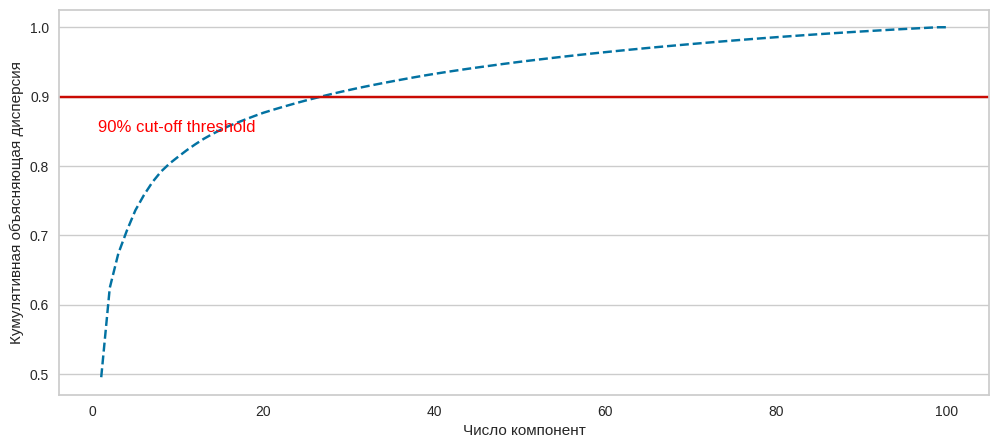

In [ ]:
pca = PCA().fit(data)

plt.figure(figsize=(12, 5))
x = np.arange(1, len(pca.explained_variance_ratio_)+1,1)
plt.plot(x, np.cumsum(pca.explained_variance_ratio_), linestyle='--', color='b')
plt.axhline(y=0.9, color='r', linestyle='-')
plt.text(0.6, 0.85, '90% cut-off threshold', color = 'red', fontsize=12)
plt.grid(axis='x')

plt.xlabel('Число компонент')
plt.ylabel('Кумулятивная объясняющая дисперсия');

In [ ]:
pca_600 = PCA(n_components=26, random_state=12345)
X = pca_600.fit_transform(data)
sum(pca_600.explained_variance_ratio_)

0.8976467470638454

In [ ]:
# Визуализируем векторы в пространстве 3 компонент

pca_3 = PCA(n_components=3, random_state=12345)
X_pca_3 = pca_3.fit_transform(data)

fig = px.scatter_3d(
    X_pca_3, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

In [ ]:
# Выделим 26 компонент
pca = PCA(n_components=26, random_state=12345)
X_emb = pca.fit_transform(data)
sum(pca.explained_variance_ratio_)

0.8976467470638454

In [ ]:
data

,col0,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40,col41,col42,col43,col44,col45,col46,col47,col48,col49,col50,col51,col52,col53,col54,col55,col56,col57,col58,col59,col60,col61,col62,col63,col64,col65,col66,col67,col68,col69,col70,col71,col72,col73,col74,col75,col76,col77,col78,col79,col80,col81,col82,col83,col84,col85,col86,col87,col88,col89,col90,col91,col92,col93,col94,col95,col96,col97,col98,col99
0,-0.013565,-0.164745,-0.138099,-0.371335,-0.080544,0.140130,-0.086076,-0.094625,0.267289,-0.105011,-0.122663,-0.295194,-0.143792,-0.281919,0.046959,0.078600,-0.326613,0.066914,0.151559,-0.145322,-0.008114,0.194097,0.111000,0.035626,-0.281231,0.184945,-0.083980,0.362145,-0.024936,0.056335,0.091151,0.015625,0.021677,0.237785,-0.121767,0.281095,0.002395,0.123247,0.008888,-0.235377,0.012335,-0.230650,0.170484,-0.388438,-0.147499,0.223788,-0.199283,-0.115643,-0.075398,0.317979,0.096194,0.180535,-0.042935,-0.289690,0.083542,-0.235199,-0.163416,0.444410,-0.037653,-0.084954,0.034991,0.177677,-0.115881,0.195292,0.054094,-0.030722,0.269662,0.013711,0.183865,-0.048877,0.046126,-0.210136,-0.242012,0.348541,-0.246430,-0.206102,-0.128048,-0.139332,0.032011,0.052596,-0.073568,-0.500340,0.358390,0.145636,-0.131344,-0.193235,-0.073180,-0.183246,-0.250432,-0.276913,-0.124208,-0.040593,0.236263,-0.099966,-0.193248,-0.123999,-0.181885,0.109877,0.224492,0.088140
1,0.199099,-0.178843,-0.181650,-0.314843,-0.237247,-0.092815,-0.102789,0.026379,0.071356,-0.195262,-0.032018,0.050593,-0.151805,0.044626,-0.137149,0.048324,-0.165805,-0.113735,0.281418,-0.093830,0.040055,0.176979,-0.059572,-0.224081,-0.290405,0.041844,-0.244209,0.139123,-0.158232,0.084756,0.004366,0.147036,0.028394,0.181765,-0.030451,0.401689,0.017696,0.071678,-0.227711,-0.221180,-0.141729,-0.152326,-0.086793,-0.254753,-0.254754,0.175460,-0.269294,-0.132804,0.172591,0.098959,-0.123064,0.145137,-0.129630,-0.104347,0.204742,-0.042199,-0.093323,0.214683,-0.002732,-0.017251,0.289635,-0.097200,-0.414250,0.197028,-0.155210,0.036211,0.243433,-0.078166,0.109224,0.026104,-0.139036,0.041474,-0.260329,0.049813,-0.178025,-0.106673,-0.129246,-0.078360,0.242932,0.202022,0.015321,-0.341110,0.395144,0.128179,-0.085020,-0.251307,-0.068250,0.084229,-0.027857,-0.199488,-0.082169,0.041674,0.081901,0.089018,-0.133567,0.057524,-0.097765,0.276776,0.269495,0.138047
2,-0.038896,0.018590,-0.232499,-0.006997,-0.249721,-0.139196,-0.113928,-0.194987,0.026871,0.099499,-0.203551,-0.057288,-0.254538,-0.267004,0.394822,-0.194092,-0.359712,0.370846,0.319253,0.299158,-0.073438,0.192204,-0.103298,0.225960,0.022397,0.189572,0.214425,0.306611,0.050518,0.129885,-0.229829,-0.137441,0.017695,0.299909,-0.143810,0.185107,0.413269,0.428544,0.216249,0.258953,0.064956,-0.057301,0.283012,-0.574683,-0.353306,0.398658,0.052187,-0.154434,0.080593,0.033812,-0.189798,0.067107,0.013428,-0.307393,0.555347,-0.413213,-0.089709,0.089540,0.320353,-0.144667,0.283973,0.091297,-0.098473,0.296574,0.099180,0.069134,-0.033914,-0.240794,-0.087717,0.035558,-0.316352,-0.189826,-0.226273,0.109457,-0.047799,0.245064,-0.592264,0.390317,0.203915,0.099657,0.038064,-0.204895,0.029691,-0.321406,-0.085455,-0.117940,-0.261115,-0.394667,-0.075990,0.007176,-0.147476,-0.020316,0.169135,-0.170203,-0.005786,0.251815,-0.080794,0.181520,-0.370257,-0.055454
3,0.074944,-0.007819,-0.250353,-0.363629,-0.206710,-0.172775,0.142860,-0.165205,0.162526,-0.124812,0.058314,0.108636,-0.044828,-0.175231,0.101159,-0.167196,0.125903,0.126798,0.517791,0.037312,-0.212595,0.132212,0.073336,-0.366573,-0.275263,0.347377,0.059192,0.257462,-0.349492,-0.053802,0.062633,-0.084200,-0.020051,0.427525,0.203549,-0.113393,0.084762,-0.045417,-0.431191,0.087079,0.314402,-0.234581,0.037949,-0.259396,-0.315118,0.022104,0.081073,-0.406416,0.126491,-0.190623,0.066531,0.261120,-0.014013,-0.226048,0.335284,-0.020481,0.155689,0

# Кластеризация эмбеддингов

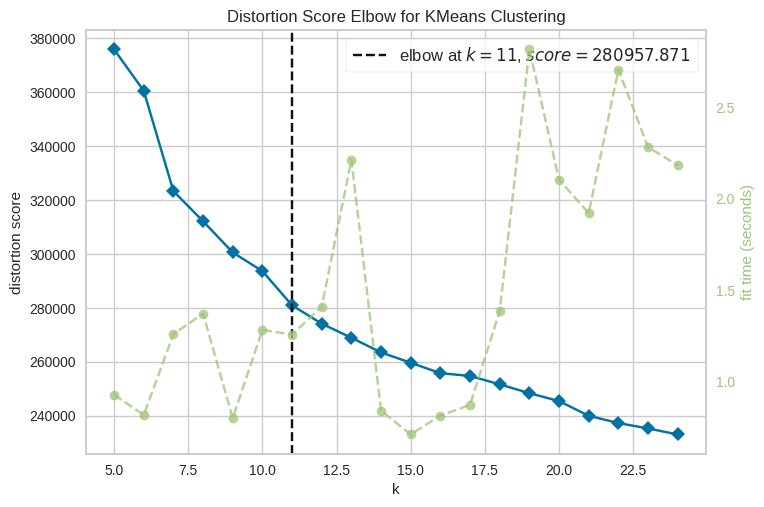

In [ ]:
visual_elbow = KElbowVisualizer(KMeans(random_state = 12345, init ='k-means++'), k = (5,25))
visual_elbow.fit(X_emb)
visual_elbow.poof()
plt.show()# говорит что 11 кластеров надо

In [ ]:
kmeans_model = KMeans(n_clusters = 5, random_state = 12345) #мы взяли 5 кластеров
labels_km = kmeans_model.fit(X_emb).labels_
silhouette_score_km = silhouette_score(X_emb, labels_km)
print('коэффициент силуэта равен', silhouette_score_km) #лучше использовать косинусное расстояние

коэффициент силуэта равен 0.38893452


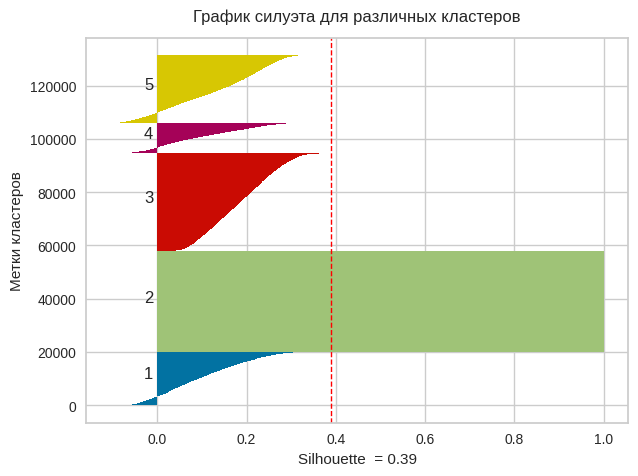

In [ ]:
silhouette_plot(X_emb, labels_km)

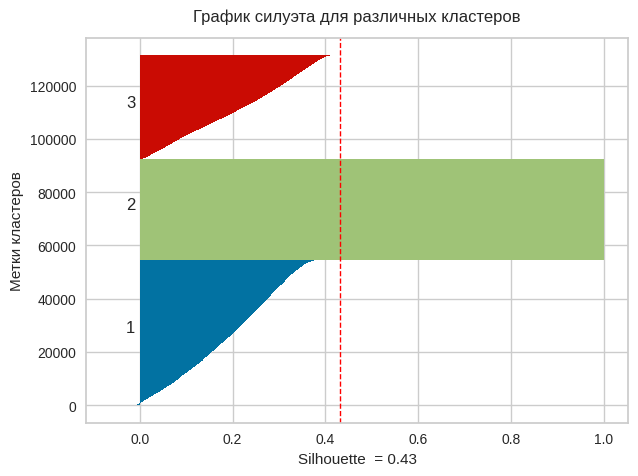

In [ ]:
kmeans_model = KMeans(n_clusters = 3, init ='k-means++', random_state = 12345)
labels_km = kmeans_model.fit(X_emb).labels_
silhouette_plot(X_emb, labels_km)

# Визуализация результатов кластеризации

In [ ]:
data['cluster'] = labels_km
data['cluster'].value_counts()

,count
cluster,
0,54606
2,38992
1,37856


In [ ]:
fig = px.scatter_3d(
    X_pca_3, x=0, y=1, z=2,
    labels={'color': 'species'},
    color = data['cluster']
)
fig.update_traces(marker_size=2)
fig.show()

In [ ]:
new_df.drop(index=IdxTrain, inplace=True)# ворд2век удалил пустые вектора, поэтому также удаляю их из текста

In [ ]:
new_df['cluster'] = labels_km

In [ ]:
new_df[new_df['cluster'] == 0]

In [ ]:
#df1=new_df[['Review Text','cluster']]

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
for i in range(0,3):
    df0=new_df[new_df['cluster'] == i]
    cnt_vec = CountVectorizer(max_features=5)# создаю словарь из 5 слов, это и есть топ 5(таким образом ищет самые часто встречаемые слова, я проверяла и другим кодом(он ниже) все сошлось)
    X = cnt_vec.fit_transform(df0['lemm_text_stop'])
    x = cnt_vec.vocabulary_
    res = dict(sorted(x.items(), key=lambda item: item[1]))
    print("Cluster %d:" % i)
    print("Топ 5 слов:", res.keys())
    df31=pd.DataFrame(X.toarray(), columns=res.keys())
    df31=df31.sum(axis=1).sort_values(ascending=False).head(5) #суммирую строки фрейма,где максимальная сумма там чаще всего встречаются топ 5 слов, это и есть топ 5 прдложений
    print("Топ 5 отзывов:\n", df0['lemm_text_stop'].iloc[df31.index]) #если что ниже есть тест на 0 кластере

# Соседи

In [ ]:
from scipy import sparse

In [ ]:
for i in range(0,3):
  dat=data[data['cluster'] == i]
  a=new_df['lemm_text_stop'][new_df['cluster'] == i]
  A_sparse=sparse.csr_matrix(dat)
  string_list = new_df['lemm_text_stop'][new_df['cluster'] == i].to_list()
  print('claster ', i)
  print('Предложение', string_list[0])
  cosine = cosine_similarity(A_sparse[0,:],A_sparse[1:,:])
  print('5 предложений соседей:')
  print(pd.DataFrame({'cosine':cosine[0],'strings':string_list[1:]}).sort_values('cosine',ascending=False).head(5))

claster  0
Предложение I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol
5 предложений соседей:
         cosine  \
28911  0.871719   
45344  0.861670   
27548  0.860203   
30232  0.858527   
30103  0.849103   

                                                                                                                                                                                                                                                                                                                                                                                                           strings  
28911                                                                  When I looking something simple stylish sexy nice comfy I always count finding I need Fashion Nova Their prices reasonable quality clothes worth price Now clothes meant last definitely one done statement pieces Be 

# Черновик

In [ ]:
new_df

,lemm_text_stop,cluster
0,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol,0
1,Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much,0
2,Prices quality products GREAT Would love see cash refund I return unused item Bought extra items since I forget add expedited shipping sent email change shipping method I would pay extra response I ended double items Other great job,2
3,Great customer service I helped Fashion Nova able provide solution problem I appreciate I love products I happy customer continue support buy brand,2
4,Disappointing experience You live advertising BOGO applied items purchased If items part purchase BOGO continue applied whole purchase items The advertising false true I read anywhere BOGO applied purchase The company shady,2
...,...,...
131909,My account missing weeks ago Fashonnova still explained I disappointed hurt I regular customer I never knew something like could happen I shop weekly,2
131910,It timely true size This company truly seems know women want wear men want see,0
131911,Kyndall helpful Definitely ordering soon,0
131912,Great customer service support honestly makes difference shopping online Kyndall super helpful went beyond resolve issue,2


In [ ]:
a

,lemm_text_stop
0,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol
1,Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much
5,Love sales huge discounts The variety quality wins every time Lastly ease returning items I satisfied gives confidence purchasing online
7,They always great sales Quality clothes amazing never disappointed My whole wardrobe Fashion Nova
8,Easy navigate site wonderful prices wait see first purchase
...,...
131885,Great communication came order quick response Love clothes especially sweaters
131902,I absolutely love Fashion Nova The best clothes affordable price quality excellent I never contact customer service best customer experience I I love
131904,Quick reply inquiries Great products well
131910,It timely true size This company truly seems know women want wear men want see


In [ ]:
data
dat=data[data['cluster'] == 2]
dat

,col0,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40,col41,col42,col43,col44,col45,col46,col47,col48,col49,col50,col51,col52,col53,col54,col55,col56,col57,col58,col59,col60,col61,col62,col63,col64,col65,col66,col67,col68,col69,col70,col71,col72,col73,col74,col75,col76,col77,col78,col79,col80,col81,col82,col83,col84,col85,col86,col87,col88,col89,col90,col91,col92,col93,col94,col95,col96,col97,col98,col99,cluster
2,-0.102048,0.124943,-0.391893,-0.209275,-0.208094,-0.096238,-0.172561,-0.104176,0.164778,0.192126,-0.039390,-0.050646,-0.108806,-0.063289,0.382811,-0.264445,-0.280535,0.405525,0.178289,0.409976,-0.164363,0.113297,-0.171080,0.154046,0.106339,0.169707,0.233546,0.206117,0.044439,0.068937,-0.069613,-0.139355,-0.011041,0.347318,-0.113886,0.320983,0.344294,0.385562,0.081783,0.321807,0.002923,0.014006,0.008524,-0.352435,-0.440646,0.373785,0.065262,-0.169273,0.036534,0.281429,-0.132487,0.018511,0.006118,-0.309976,0.505296,-0.481620,-0.068425,0.039477,0.233536,-0.200073,0.156969,0.093280,-0.234445,0.000299,0.199386,0.030128,-0.138129,-0.248976,-0.067528,0.019174,-0.120894,-0.361733,-0.274877,0.246769,-0.164528,0.060160,-0.686067,0.302738,0.191435,0.210370,0.059876,-0.141568,0.092980,-0.326892,-0.054673,-0.133877,-0.286813,-0.285770,-0.217670,-0.103734,-0.269809,-0.003517,0.145739,-0.309952,-0.095541,0.294853,-0.016079,0.096700,-0.491093,-0.138461,2
3,0.093664,0.085555,-0.249077,-0.244564,-0.328244,-0.158951,-0.041797,-0.286350,0.179505,-0.030806,0.306634,-0.071370,-0.068175,-0.202393,-0.140377,0.013998,0.137851,0.194079,0.334128,-0.004819,-0.172589,0.204816,-0.066639,-0.508214,-0.192946,0.268868,0.144758,0.265940,-0.419349,-0.076495,0.036671,-0.103126,-0.068717,0.420310,0.258214,-0.119365,0.222502,0.119877,-0.318797,0.028399,0.177645,-0.223416,-0.133732,-0.263005,-0.346875,0.024877,-0.033323,-0.301201,0.009761,-0.139470,0.171070,0.335354,-0.027064,-0.074751,0.318823,-0.079598,0.077042,0.265266,-0.139301,0.105631,0.013383,-0.119227,-0.609127,-0.152111,0.033426,0.128996,0.278699,-0.272083,0.040648,0.073893,-0.134336,-0.144237,-0.073013,0.093933,-0.248631,-0.231489,-0.051783,0.105842,0.444683,0.082254,-0.074995,-0.243357,0.530455,-0.165304,-0.177041,-0.336441,-0.210181,-0.028664,0.065294,0.005207,0.163008,0.142648,0.135503,-0.232562,-0.025686,0.120236,-0.028412,0.107420,0.073244,-0.011726,2
4,-0.079057,0.212255,-0.165984,-0.063936,-0.063519,0.260165,-0.110479,-0.170431,0.189776,0.044012,0.027422,0.035381,-0.142872,-0.144381,0.258425,0.183017,-0.126251,0.281192,0.342337,-0.011730,0.045515,0.264036,0.025936,0.216568,0.132219,-0.122038,0.527197,0.388192,-0.213974,-0.122779,-0.196965,-0.588877,-0.208306,0.383842,0.046998,0.253872,0.049211,0.469144,0.238788,0.318539,0.287342,0.089306,0.419216,-0.493621,-0.394071,0.163934,-0.165067,0.000291,-0.261530,0.424212,-0.387841,0.301537,-0.246554,-0.224399,0.361094,-0.272793,-0.269572,0.217906,0.294906,0.016805,0.275839,0.026794,-0.019845,-0.133114,-0.020572,0.071421,0.167018,-0.294535,-0.023785,-0.227023,-0.235510,-0.490604,0.320751,-0.001500,-0.156984,-0.243172,-0.390260,-0.005332,0.191687,-0.003000,-0.301395,-0.267515,0.009022,-0.030466,-0.155838,0.081542,-0.012740,-0.320078,-0.041606,0.066306,-0.218804,0.034363,-0.018244,0.290010,0.097736,0.412591,0.193823,-0.245414,-0.442142,0.189517,2
6,-0.065451,-0.278899,-0.482975,-0.043350,-0.206459,0.076714,-0.312647,0.260544,-0.021876,-0.008530,0.081923,-0.190281,-0.132308,-0.194918,0.290709,0.003857,-0.110474,0.284473,0.317599,-0.102474,0.119130,0.146733,0.105767,0.199412,-0.035450,0.348728,0.082852,0.125900,-0.052569,0.274960,-0.097162,-0.175873,0.038549,0.250278,-0.154338,0.363189,-0.149419,0.067424,-0.022310,0.156687,-0.043151,-0.138456,0.092385,-0.366076,-0.150441,0.207280,-0.040571,-0.033930,-0.272440,0.313904,-0.154794,0.200314,-0.183447,-0.253614,0.141004,-0.1912

In [ ]:
a=new_df['lemm_text_stop'][new_df['cluster'] == 2]

In [ ]:
a

,lemm_text_stop
2,Prices quality products GREAT Would love see cash refund I return unused item Bought extra items since I forget add expedited shipping sent email change shipping method I would pay extra response I ended double items Other great job
3,Great customer service I helped Fashion Nova able provide solution problem I appreciate I love products I happy customer continue support buy brand
4,Disappointing experience You live advertising BOGO applied items purchased If items part purchase BOGO continue applied whole purchase items The advertising false true I read anywhere BOGO applied purchase The company shady
6,I like often Fashion Nova clothes go sale steep price cuts The additional incentive coupons always keep coming back
9,I love items issue past times I ordered package arrived days AFTER original delivery time always disappointing
...,...
131907,I one bad experience another buying items advertised Instagram As result I really expecting much I placed order except slow shipping ignored emails attitude deign answer one I happy say I pleasantly surprised My order shipped quickly customer service kept updated order step step I please quality fit items I purchased You ask
131908,Thank much responding timely manner Greatly appreciated
131909,My account missing weeks ago Fashonnova still explained I disappointed hurt I regular customer I never knew something like could happen I shop weekly
131912,Great customer service support honestly makes difference shopping online Kyndall super helpful went beyond resolve issue


In [ ]:
dat.iloc[0,:]

,2
col0,-0.102048
col1,0.124943
col2,-0.391893
col3,-0.209275
col4,-0.208094
...,...
col96,-0.016079
col97,0.096700
col98,-0.491093
col99,-0.138461


In [ ]:
dat.iloc[1:,:]

,col0,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40,col41,col42,col43,col44,col45,col46,col47,col48,col49,col50,col51,col52,col53,col54,col55,col56,col57,col58,col59,col60,col61,col62,col63,col64,col65,col66,col67,col68,col69,col70,col71,col72,col73,col74,col75,col76,col77,col78,col79,col80,col81,col82,col83,col84,col85,col86,col87,col88,col89,col90,col91,col92,col93,col94,col95,col96,col97,col98,col99,cluster
3,0.093664,0.085555,-0.249077,-0.244564,-0.328244,-0.158951,-0.041797,-0.286350,0.179505,-0.030806,0.306634,-0.071370,-0.068175,-0.202393,-0.140377,0.013998,0.137851,0.194079,0.334128,-0.004819,-0.172589,0.204816,-0.066639,-0.508214,-0.192946,0.268868,0.144758,0.265940,-0.419349,-0.076495,0.036671,-0.103126,-0.068717,0.420310,0.258214,-0.119365,0.222502,0.119877,-0.318797,0.028399,0.177645,-0.223416,-0.133732,-0.263005,-0.346875,0.024877,-0.033323,-0.301201,0.009761,-0.139470,0.171070,0.335354,-0.027064,-0.074751,0.318823,-0.079598,0.077042,0.265266,-0.139301,0.105631,0.013383,-0.119227,-0.609127,-0.152111,0.033426,0.128996,0.278699,-0.272083,0.040648,0.073893,-0.134336,-0.144237,-0.073013,0.093933,-0.248631,-0.231489,-0.051783,0.105842,0.444683,0.082254,-0.074995,-0.243357,0.530455,-0.165304,-0.177041,-0.336441,-0.210181,-0.028664,0.065294,0.005207,0.163008,0.142648,0.135503,-0.232562,-0.025686,0.120236,-0.028412,0.107420,0.073244,-0.011726,2
4,-0.079057,0.212255,-0.165984,-0.063936,-0.063519,0.260165,-0.110479,-0.170431,0.189776,0.044012,0.027422,0.035381,-0.142872,-0.144381,0.258425,0.183017,-0.126251,0.281192,0.342337,-0.011730,0.045515,0.264036,0.025936,0.216568,0.132219,-0.122038,0.527197,0.388192,-0.213974,-0.122779,-0.196965,-0.588877,-0.208306,0.383842,0.046998,0.253872,0.049211,0.469144,0.238788,0.318539,0.287342,0.089306,0.419216,-0.493621,-0.394071,0.163934,-0.165067,0.000291,-0.261530,0.424212,-0.387841,0.301537,-0.246554,-0.224399,0.361094,-0.272793,-0.269572,0.217906,0.294906,0.016805,0.275839,0.026794,-0.019845,-0.133114,-0.020572,0.071421,0.167018,-0.294535,-0.023785,-0.227023,-0.235510,-0.490604,0.320751,-0.001500,-0.156984,-0.243172,-0.390260,-0.005332,0.191687,-0.003000,-0.301395,-0.267515,0.009022,-0.030466,-0.155838,0.081542,-0.012740,-0.320078,-0.041606,0.066306,-0.218804,0.034363,-0.018244,0.290010,0.097736,0.412591,0.193823,-0.245414,-0.442142,0.189517,2
6,-0.065451,-0.278899,-0.482975,-0.043350,-0.206459,0.076714,-0.312647,0.260544,-0.021876,-0.008530,0.081923,-0.190281,-0.132308,-0.194918,0.290709,0.003857,-0.110474,0.284473,0.317599,-0.102474,0.119130,0.146733,0.105767,0.199412,-0.035450,0.348728,0.082852,0.125900,-0.052569,0.274960,-0.097162,-0.175873,0.038549,0.250278,-0.154338,0.363189,-0.149419,0.067424,-0.022310,0.156687,-0.043151,-0.138456,0.092385,-0.366076,-0.150441,0.207280,-0.040571,-0.033930,-0.272440,0.313904,-0.154794,0.200314,-0.183447,-0.253614,0.141004,-0.191210,-0.423266,0.243364,0.177486,-0.119493,0.267042,-0.082367,-0.281458,0.079093,0.004388,-0.086070,0.069366,-0.150849,0.161488,-0.058177,-0.109938,-0.032445,-0.187602,0.186570,0.107392,-0.210103,-0.132858,0.326382,0.086065,0.274704,0.044126,-0.180024,0.150005,0.053264,-0.015572,-0.154887,-0.188769,-0.009689,-0.236432,-0.191061,0.083585,-0.115925,0.262447,-0.312903,0.100084,0.195261,0.200562,0.278966,0.253772,0.106244,2
9,-0.237638,-0.130267,-0.183537,-0.122291,0.094283,-0.234814,-0.346260,-0.205213,0.232832,0.195490,-0.000318,0.002163,-0.058597,0.032090,0.052775,-0.158762,-0.392683,0.441634,-0.018425,0.416021,-0.220321,-0.054371,0.006276,-0.105152,-0.354650,-0.216705,0.442488,0.350770,0.361372,-0.147768,0.211984,-0.337884,0.130987,0.515237,-0.061827,0.123462,0.067259,0.367344,0.228005,0.322111,0.284906,0.308428,-0.126704,-0.139884,-0.222758,0.360911,0.214447,-0.271195,0.346386,0.201928,0.233694,-0.220114,0.031157,-0.192402,0.339092,-0.401082,

In [ ]:
from scipy import sparse

In [ ]:
A_sparse=sparse.csr_matrix(dat)

In [ ]:
string_list = new_df['lemm_text_stop'][new_df['cluster'] == 0].to_list()

In [ ]:
string_list

['I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol',
 'Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much',
 'Love sales huge discounts The variety quality wins every time Lastly ease returning items I satisfied gives confidence purchasing online',
 'They always great sales Quality clothes amazing never disappointed My whole wardrobe Fashion Nova',
 'Easy navigate site wonderful prices wait see first purchase',
 'Good quality Fast shippingAmazing specials Love bogo deals',
 'I shopping FN quite sometime I disappointed thus far thank God The quality good shipping quite fast I would definitely recommend',
 'I loved payment options ease application Experience simple',
 'Fashionova keep looking fly budget I love Your getting new fa

In [ ]:
string_list[1:]

['Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much',
 'Love sales huge discounts The variety quality wins every time Lastly ease returning items I satisfied gives confidence purchasing online',
 'They always great sales Quality clothes amazing never disappointed My whole wardrobe Fashion Nova',
 'Easy navigate site wonderful prices wait see first purchase',
 'Good quality Fast shippingAmazing specials Love bogo deals',
 'I shopping FN quite sometime I disappointed thus far thank God The quality good shipping quite fast I would definitely recommend',
 'I loved payment options ease application Experience simple',
 'Fashionova keep looking fly budget I love Your getting new fahionable clothing old resale shop prices Thanks Fashionova bff fa life',
 'Fashion Nova always best deals fashion delivery',
 'My favorite place buy onli

In [ ]:
string_list[0]

'I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol'

In [ ]:
cosine = cosine_similarity(A_sparse[0,:],A_sparse[1:,:])

In [ ]:
len(cosine[0])

39079

In [ ]:
len(string_list[1:])

54520

In [ ]:
cosine1=cosine[0]

In [ ]:
len(cosine)

1

In [ ]:
pd.DataFrame({'cosine':cosine[0],'strings':string_list[1:]}).sort_values('cosine',ascending=False).head(5)


ValueError: All arrays must be of the same length

In [ ]:
#for i in range(0,3):
 #   df0=new_df[new_df['cluster'] == i]
 #   cnt_vec = CountVectorizer()
 #   X = cnt_vec.fit_transform(df0['lemm_text_stop'])
 #   x = cnt_vec.vocabulary_
 #   res = dict(sorted(x.items(), key=lambda item: item[1]))
 #   df01=pd.DataFrame(X.toarray(), columns=res.keys())
 #   print("Cluster %d:" % i)
 #   print(df01.sum().sort_values(ascending=False).head(5))

Cluster 0:
love       20400
great      16426
fashion    10752
clothes    10545
nova        9615
dtype: int64
Cluster 1:
review    37851
found     37850
text      37850
to            3
the           3
dtype: int64
Cluster 2:
order      14208
fashion     9445
nova        9096
get         8327
items       8033
dtype: int64


In [ ]:
df3

,lemm_text_stop,cluster
0,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol,0
1,Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much,0
5,Love sales huge discounts The variety quality wins every time Lastly ease returning items I satisfied gives confidence purchasing online,0
7,They always great sales Quality clothes amazing never disappointed My whole wardrobe Fashion Nova,0
8,Easy navigate site wonderful prices wait see first purchase,0
...,...,...
131885,Great communication came order quick response Love clothes especially sweaters,0
131902,I absolutely love Fashion Nova The best clothes affordable price quality excellent I never contact customer service best customer experience I I love,0
131904,Quick reply inquiries Great products well,0
131910,It timely true size This company truly seems know women want wear men want see,0


In [ ]:
df3=new_df[new_df['cluster'] == 0]

In [ ]:
df3

,lemm_text_stop,cluster
0,I love ordering fashion nova The clothes good quality long read reviews items picking right sizes comfortable happy I even got BF putting orders lol,0
1,Always amazing clothes fast shipping really good let talk CLOTHES omggggg stretchy fabrics I loveeee If need quick easy fit fashion nova store I international customer trust fashion nova never disappoint love much,0
5,Love sales huge discounts The variety quality wins every time Lastly ease returning items I satisfied gives confidence purchasing online,0
7,They always great sales Quality clothes amazing never disappointed My whole wardrobe Fashion Nova,0
8,Easy navigate site wonderful prices wait see first purchase,0
...,...,...
131885,Great communication came order quick response Love clothes especially sweaters,0
131902,I absolutely love Fashion Nova The best clothes affordable price quality excellent I never contact customer service best customer experience I I love,0
131904,Quick reply inquiries Great products well,0
131910,It timely true size This company truly seems know women want wear men want see,0


In [ ]:
cnt_vec = CountVectorizer(max_features=5)
X = cnt_vec.fit_transform(df3['lemm_text_stop'])
x = cnt_vec.vocabulary_
res = dict(sorted(x.items(), key=lambda item: item[1]))
df31=pd.DataFrame(X.toarray(), columns=res.keys())
df31.sum( axis=1).sort_values(ascending=False).head(5)

,0
36051,16
44244,15
49034,15
4608,14
11243,14


In [ ]:
df32=df31.sum(axis=1).sort_values(ascending=False).head(5)
df32

,0
36051,16
44244,15
49034,15
4608,14
11243,14


In [ ]:
df3.iloc[11243]

,27583
lemm_text_stop,Everything I love way fashion Nova always date clothes plus size fashion trendy clothes sometimes runs little small butt know Upper size things little bit smaller still fit looked awesome quality amazing And compliments I get clothes Fashion Nova phenomenal love fashion Nova ever since I found I shop anywhere else I know go office work going lounging sleep well sexy well seasonal wear awesome highly recommend fashionable fashion Nova
cluster,0


In [ ]:
df32.index

Index([36051, 44244, 49034, 4608, 11243], dtype='int64')

In [ ]:
df3['lemm_text_stop'].iloc[df32.index]

,lemm_text_stop
84592,I order items fashion Nova I love outfit clothes fit perfect clothes fashion Nova I happy fashion Nova fan I always find size fashion Nova website yes I recommend friends Fashion Nova thank DWilliams Maybe I next top model fashion Nova clothes magazine website Lol
104275,Fashion Nova great place shop online My weight always fluctuate I happy I go Fashion Curve buy clothes I gain weight small clothes I loose one place I know I always count Fashion Nova something wear occasion whether birthday celebration friend party work everyday fashion I also count clothes timely fashion well I always recommend friends order Fashion Nova whenever need outfit matter Fashion Nova
116393,I love fashion nova I love clothes I actually shopping fashion nova since I love discounts deals I love seeing different color women modeling clothes I wish jeans little cheaper like price jeans around But I love kids clothes woman clothes slippers I wish fashion Nova would make certain outfits different colors causal dresses without crazy colors
11650,great great great great great great great great great great great great great great
27583,Everything I love way fashion Nova always date clothes plus size fashion trendy clothes sometimes runs little small butt know Upper size things little bit smaller still fit looked awesome quality amazing And compliments I get clothes Fashion Nova phenomenal love fashion Nova ever since I found I shop anywhere else I know go office work going lounging sleep well sexy well seasonal wear awesome highly recommend fashionable fashion Nova


In [ ]:
#найти косинусное расстояние отсротировать и выбрать первые 5

In [ ]:
word_frequencies_by_cluster = data.groupby('cluster').sum()

In [ ]:
word_frequencies_by_cluster

In [ ]:
print(word_frequencies_by_cluster.loc[0].sort_values(ascending=False)) #слово 35,60,62,97,67

In [ ]:
print(word_frequencies_by_cluster.loc[1].sort_values(ascending=False)) #слово 35,60,62,97,67

In [ ]:
print(word_frequencies_by_cluster.loc[2].sort_values(ascending=False)) #слово 35,60,62,97,67

In [ ]:
df1=data[data['cluster'] == 0]

In [ ]:
df2=df['Review Text']

In [ ]:
labels_km.shape

In [ ]:
df2['cluster'] = labels_km

In [ ]:
df2